In [83]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import plotly.express as px
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

In [84]:
df1 = pd.read_csv('/Users/linhdao/Library/CloudStorage/OneDrive-TheUniversityOfNewcastle/COMP3330/asssessment 2 - individual project/domain_properties.csv')
df1.describe()
df1.info()
print('Number of instances = %d' % (df1.shape[0]))
print('Number of attributes = %d' % (df1.shape[1]))
df1

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11160 entries, 0 to 11159
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     11160 non-null  int64  
 1   date_sold                 11160 non-null  object 
 2   suburb                    11160 non-null  object 
 3   num_bath                  11160 non-null  int64  
 4   num_bed                   11160 non-null  int64  
 5   num_parking               11160 non-null  int64  
 6   property_size             11160 non-null  int64  
 7   type                      11160 non-null  object 
 8   suburb_population         11160 non-null  int64  
 9   suburb_median_income      11160 non-null  int64  
 10  suburb_sqkm               11160 non-null  float64
 11  suburb_lat                11160 non-null  float64
 12  suburb_lng                11160 non-null  float64
 13  suburb_elevation          11160 non-null  int64  
 14  cash_r

,price,date_sold,suburb,num_bath,num_bed,num_parking,property_size,type,suburb_population,suburb_median_income,suburb_sqkm,suburb_lat,suburb_lng,suburb_elevation,cash_rate,property_inflation_index,km_from_cbd
0,530000,13/1/16,Kincumber,4,4,2,1351,House,7093,29432,9.914,-33.47252,151.40208,24,2.0,150.9,47.05
1,525000,13/1/16,Halekulani,2,4,2,594,House,2538,24752,1.397,-33.21772,151.55237,23,2.0,150.9,78.54
2,480000,13/1/16,Chittaway Bay,2,4,2,468,House,2028,31668,1.116,-33.32678,151.44557,3,2.0,150.9,63.59
3,452000,13/1/16,Leumeah,1,3,1,344,House,9835,32292,4.055,-34.05375,150.83957,81,2.0,150.9,40.12
4,365500,13/1/16,North Avoca,0,0,0,1850,Vacant land,2200,45084,1.497,-33.45608,151.43598,18,2.0,150.9,49.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11155,1900000,31/12/21,Kellyville,3,4,2,540,House,27971,46228,18.645,-33.69583,150.95622,78,0.1,220.1,30.08
11156,1300000,31/12/21,Seven Hills,3,7,2,1208,House,19326,33540,9.629,-33.77743,150.94272,38,0.1,220.1,26.58
11157,1025000,31/12/21,Sydney,2,2,1,129,Apartment / Unit / Flat,17252,35412,2.940,-33.86794,151.20998,65,0.1,220.1,0.31
11158,1087500,1/1/22,Prestons,2,4,2,384,House,15313,36244,9.215,-33.94155,150.87334,28,0.1,220.1,32.26


In [85]:
#dataset 1
print('Counting missing data for each feature')
df1.isnull().sum()

Counting missing data for each feature


price                       0
date_sold                   0
suburb                      0
num_bath                    0
num_bed                     0
num_parking                 0
property_size               0
type                        0
suburb_population           0
suburb_median_income        0
suburb_sqkm                 0
suburb_lat                  0
suburb_lng                  0
suburb_elevation            0
cash_rate                   0
property_inflation_index    0
km_from_cbd                 0
dtype: int64

In [86]:
# Correct data types
df1['date_sold'] = pd.to_datetime(df1['date_sold'])

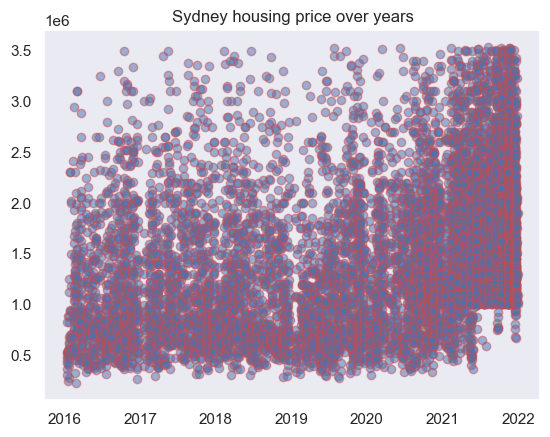

In [87]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df1['price'].quantile(0.25)
Q3 = df1['price'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the dataset to remove outliers
df1_filtered = df1[(df1['price'] >= lower_bound) & (df1['price'] <= upper_bound)]


# Plot the filtered data
plt.scatter(df1_filtered.date_sold, df1_filtered.price, marker='o', c='b', edgecolor='r', alpha=0.5)
plt.title("Sydney housing price over years")
plt.grid()
plt.show()


In [88]:
suburbs = df1_filtered.groupby(['suburb'])['price'].aggregate('median')
print(suburbs)

suburb
Abbotsbury        1425000.0
Abbotsford        2105000.0
Acacia Gardens    1152500.0
Alexandria        1325500.0
Alfords Point     1555000.0
                    ...    
Yarrawarrah       1492500.0
Yattalunga        1181000.0
Yellow Rock       1475000.0
Yowie Bay         1980000.0
Zetland           1445000.0
Name: price, Length: 634, dtype: float64


In [89]:
suburbs = pd.DataFrame(suburbs).reset_index()
suburbs.head()

,suburb,price
0,Abbotsbury,1425000.0
1,Abbotsford,2105000.0
2,Acacia Gardens,1152500.0
3,Alexandria,1325500.0
4,Alfords Point,1555000.0


In [90]:
results = []

for i in suburbs['price']:
    if i <= suburbs['price'].quantile(0.25):
        results.append('low')
    elif i > suburbs['price'].quantile(0.25) and i <= suburbs['price'].quantile(0.50):
        results.append('medium_low')
    elif i > suburbs['price'].quantile(0.50) and i <= suburbs['price'].quantile(0.75):
        results.append('medium_high')
    else:
        results.append('high')
        
    
# add to new dataframe
suburbs['suburb_group'] = results

In [91]:
suburbs

,suburb,price,suburb_group
0,Abbotsbury,1425000.0,medium_low
1,Abbotsford,2105000.0,high
2,Acacia Gardens,1152500.0,medium_low
3,Alexandria,1325500.0,medium_low
4,Alfords Point,1555000.0,medium_high
...,...,...,...
629,Yarrawarrah,1492500.0,medium_high
630,Yattalunga,1181000.0,medium_low
631,Yellow Rock,1475000.0,medium_high
632,Yowie Bay,1980000.0,high


In [92]:
# Export the dataset to a CSV file
suburbs.to_csv('dataset_output.csv', index=False)  # Replace `df1` with your DataFrame variable

dataset_output = pd.read_csv('dataset_output.csv')
dataset_output

,suburb,price,suburb_group
0,Abbotsbury,1425000.0,medium_low
1,Abbotsford,2105000.0,high
2,Acacia Gardens,1152500.0,medium_low
3,Alexandria,1325500.0,medium_low
4,Alfords Point,1555000.0,medium_high
...,...,...,...
629,Yarrawarrah,1492500.0,medium_high
630,Yattalunga,1181000.0,medium_low
631,Yellow Rock,1475000.0,medium_high
632,Yowie Bay,1980000.0,high


In [93]:
# converting into a dictionary
suburb = suburbs['suburb']
suburb_group = suburbs['suburb_group']
suburb_dict = dict(zip(suburb, suburb_group))

# converting to an array to fill with grouped values
convert = df1_filtered.suburb
convert = list(convert)

# conversion into an array
new_list = []

for conversion in convert:
    for check in suburb_dict:
        if conversion == check:
            new_list.append(suburb_dict[check])
print(f"Length of dataframe : {len(df1_filtered)}")
print(f"Length of array : {len(new_list)}")

Length of dataframe : 10578
Length of array : 10578


In [94]:
df1_filtered['suburb_group'] = new_list
df1_filtered.head()

/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/897303118.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,price,date_sold,suburb,num_bath,num_bed,num_parking,property_size,type,suburb_population,suburb_median_income,suburb_sqkm,suburb_lat,suburb_lng,suburb_elevation,cash_rate,property_inflation_index,km_from_cbd,suburb_group
0,530000,2016-01-13,Kincumber,4,4,2,1351,House,7093,29432,9.914,-33.47252,151.40208,24,2.0,150.9,47.05,low
1,525000,2016-01-13,Halekulani,2,4,2,594,House,2538,24752,1.397,-33.21772,151.55237,23,2.0,150.9,78.54,low
2,480000,2016-01-13,Chittaway Bay,2,4,2,468,House,2028,31668,1.116,-33.32678,151.44557,3,2.0,150.9,63.59,low
3,452000,2016-01-13,Leumeah,1,3,1,344,House,9835,32292,4.055,-34.05375,150.83957,81,2.0,150.9,40.12,low
4,365500,2016-01-13,North Avoca,0,0,0,1850,Vacant land,2200,45084,1.497,-33.45608,151.43598,18,2.0,150.9,49.98,medium_high


In [95]:
df1_filtered['type'].value_counts()

House                            9047
Apartment / Unit / Flat           668
Townhouse                         211
Semi-Detached                     167
Vacant land                       159
Villa                             113
Duplex                             67
Terrace                            58
Block of Units                     25
Acreage / Semi-Rural               20
New House & Land                   15
New Apartments / Off the Plan       9
Development Site                    7
Studio                              5
Rural                               4
New land                            3
Name: type, dtype: int64

In [96]:
df1_filtered['type'].unique()

array(['House', 'Vacant land', 'Townhouse', 'Apartment / Unit / Flat',
       'Semi-Detached', 'New House & Land', 'Duplex', 'Villa', 'New land',
       'Terrace', 'Studio', 'Development Site', 'Block of Units',
       'Acreage / Semi-Rural', 'New Apartments / Off the Plan', 'Rural'],
      dtype=object)

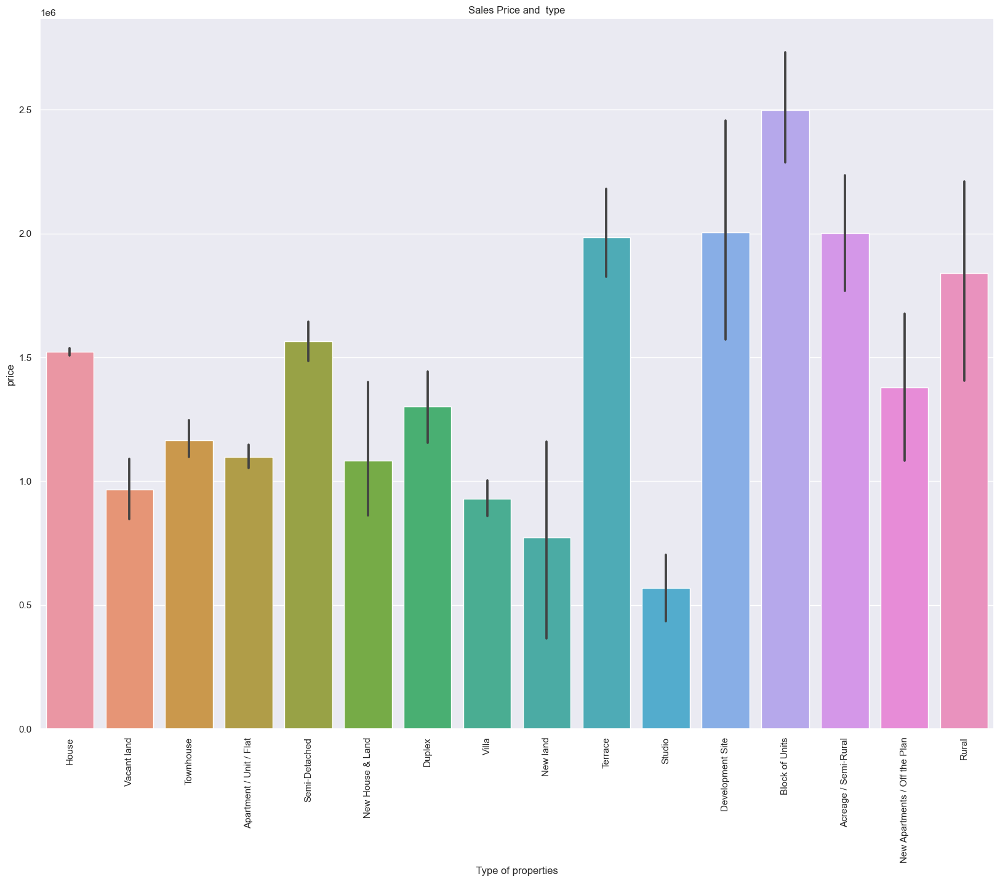

In [97]:
sns.set()
# Create a Figure and an Axes with plt.subplots
fig, ax = plt.subplots(1,1,figsize=(20,15),sharex=False)

#county_order = data_merge.sort_values('price')['Region']

#sns.barplot(x='State', y='Headcount Ratio (%)', data=gdf_regions, ax=ax1, color='c', )

sns.barplot(ax=ax,data =df1_filtered, x="type", y="price" )
ax.set_ylabel("price")
ax.set_xlabel(" Type of properties ")
ax.title.set_text("Sales Price and  type")
plt.xticks(rotation='vertical')
plt.show()

In [98]:
# converting to array 
types = df1_filtered['type'].to_list()

# groupings
house = ['House', 'New House & Land', 'Villa','Duplex','Terrace']
apartments = ['Apartment / Unit / Flat', 'Townhouse', 'Studio']

# new array
new_types = []

for conversion in types:
    if conversion in house:
        new_types.append('house')
    elif conversion in apartments:
        new_types.append('apartments')
    else:
        new_types.append('other')

# inputting into dataframe
df1_filtered['type'] = new_types

/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/3390165647.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



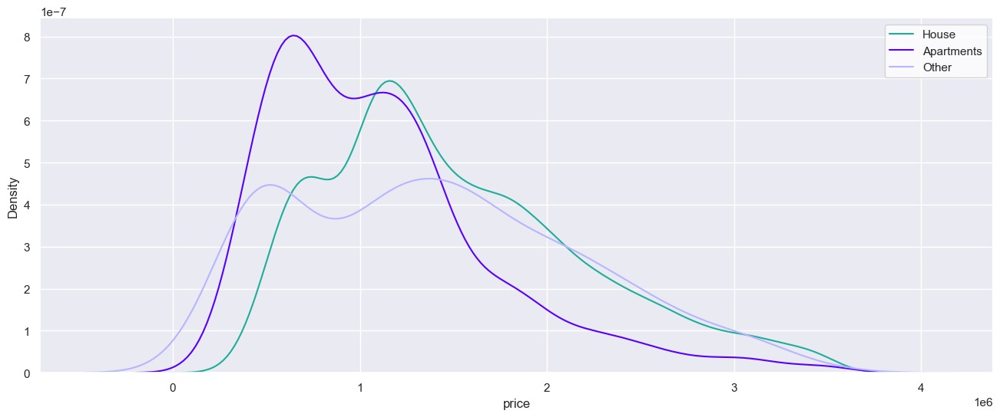

In [99]:
fig, ax = plt.subplots(1,1,figsize=(16, 6), dpi=100)
sns.set_theme(style='whitegrid')
sns.despine()
sns.kdeplot(df1_filtered[df1_filtered['type']=='house']['price'], color='#1EAE98', ax=ax, label='House')
sns.kdeplot(df1_filtered[df1_filtered['type']=='apartments']['price'], color='#5800FF', ax=ax, label='Apartments')
sns.kdeplot(df1_filtered[df1_filtered['type']=='other']['price'], color='#B8B5FF', ax=ax, label='Other')
plt.legend()
plt.show()

In [204]:
# Map the 'type' column to numeric values
type_mapping = {'house': 0, 'apartments': 1, 'other': 2}
df1_filtered['type_numeric'] = df1_filtered['type'].map(type_mapping)

# Display the updated DataFrame
print(df1_filtered[['type', 'type_numeric']].head())
df1_filtered

    type  type_numeric
0  house             0
1  house             0
2  house             0
3  house             0
4  other             2


/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/2545418222.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,price,date_sold,suburb,num_bath,num_bed,num_parking,property_size,type,suburb_population,suburb_median_income,suburb_sqkm,suburb_lat,suburb_lng,suburb_elevation,cash_rate,property_inflation_index,km_from_cbd,suburb_group,type_numeric
0,530000,2016-01-13,Kincumber,4,4,2,1351,house,7093,29432,9.914,-33.47252,151.40208,24,2.0,150.9,47.05,low,0
1,525000,2016-01-13,Halekulani,2,4,2,594,house,2538,24752,1.397,-33.21772,151.55237,23,2.0,150.9,78.54,low,0
2,480000,2016-01-13,Chittaway Bay,2,4,2,468,house,2028,31668,1.116,-33.32678,151.44557,3,2.0,150.9,63.59,low,0
3,452000,2016-01-13,Leumeah,1,3,1,344,house,9835,32292,4.055,-34.05375,150.83957,81,2.0,150.9,40.12,low,0
4,365500,2016-01-13,North Avoca,0,0,0,1850,other,2200,45084,1.497,-33.45608,151.43598,18,2.0,150.9,49.98,medium_high,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11155,1900000,2021-12-31,Kellyville,3,4,2,540,house,27971,46228,18.645,-33.69583,150.95622,78,0.1,220.1,30.08,medium_low,0
11156,1300000,2021-12-31,Seven Hills,3,7,2,1208,house,19326,33540,9.629,-33.77743,150.94272,38,0.1,220.1,26.58,low,0
11157,1025000,2021-12-31,Sydney,2,2,1,129,apartments,17252,35412,2.940,-33.86794,151.20998,65,0.1,220.1,0.31,medium_low,1
11158,1087500,2022-01-01,Prestons,2,4,2,384,house,15313,36244,9.215,-33.94155,150.87334,28,0.1,220.1,32.26,low,0


In [100]:
import plotly.express as px
sqft_trend = pd.concat([df1_filtered['price'], df1_filtered['property_size']], axis = 1)
fig = px.scatter(df1_filtered, x = 'property_size', y = 'price', title = 'Price vs Property Size', labels = 'dict(price = "Price ", sqft_living = "Sqft ")')
fig.update_layout(yaxis_range = [0 , 4000000], xaxis_range = [0 , 15000], width = 800, height = 600)
fig.show()

In [101]:
import plotly.express as px
sqft_trend = pd.concat([df1_filtered['price'], df1_filtered['km_from_cbd']], axis = 1)
fig = px.scatter(df1_filtered, x = 'km_from_cbd', y = 'price', title = 'Price vs KM from CBD', labels = dict(price = "Price ", sqft_living = "Sqft "))
fig.update_layout(yaxis_range = [0 , 4000000], xaxis_range = [0 , 90], width = 800, height = 600)
fig.show()

In [102]:
sqft_trend = pd.concat([df1_filtered['price'], df1_filtered['date_sold']], axis = 1)
fig = px.scatter(df1_filtered, x = 'date_sold', y = 'price', title = 'Price vs Date Sold', labels = dict(price = "Price ", sqft_living = "Sqft "))
fig.update_layout(yaxis_range = [0 , 4000000], xaxis_range = ["2016", "2022"], width = 800, height = 600)
fig.show()

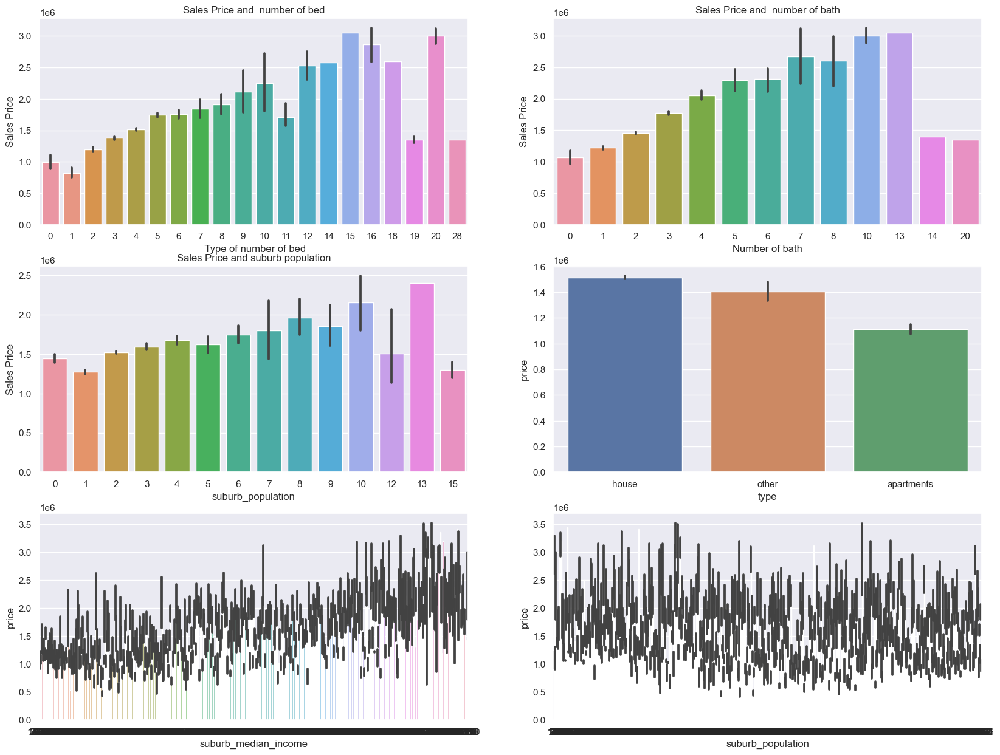

In [103]:
sns.set()
# Create a Figure and an Axes with plt.subplots
fig, ax = plt.subplots(3,2,figsize=(20,15))

sns.barplot(ax=ax[0, 0],data =df1_filtered, x="num_bed", y="price")
ax[0,0].set_ylabel("Sales Price")
ax[0,0].set_xlabel(" Type of number of bed")
ax[0,0].title.set_text("Sales Price and  number of bed")

sns.barplot(ax=ax[0, 1],data =df1_filtered, x="num_bath", y="price")
ax[0,1].set_ylabel("Sales Price")
ax[0,1].set_xlabel("Number of bath")
ax[0,1].title.set_text("Sales Price and  number of bath")

sns.barplot(ax=ax[1, 0],data =df1_filtered, x="num_parking", y="price")
ax[1,0].set_ylabel("Sales Price")
ax[1,0].set_xlabel("Number of parking")
ax[1,0].title.set_text("Sales Price and  number of parking")


sns.barplot(ax=ax[1, 1],data =df1_filtered, x="type", y="price")
ax[1,0].set_ylabel("Sales Price")
ax[1,0].set_xlabel("type")
ax[1,0].title.set_text("Sales Price and type")


sns.barplot(ax=ax[2, 0],data =df1_filtered, x="suburb_median_income", y="price")
ax[1,0].set_ylabel("Sales Price")
ax[1,0].set_xlabel("suburb_median_income")
ax[1,0].title.set_text("Sales Price and suburb_median_income")

sns.barplot(ax=ax[2, 1],data =df1_filtered, x="suburb_population", y="price")
ax[1,0].set_ylabel("Sales Price")
ax[1,0].set_xlabel("suburb_population")
ax[1,0].title.set_text("Sales Price and suburb population")

plt.show()

In [104]:
from folium import Map
from folium.plugins import HeatMap
import branca.colormap as cm

heat_data = [[row['suburb_lat'],row['suburb_lng']] for _, row in df1_filtered.iterrows()]
heat_map = Map(df1_filtered[['suburb_lat', 'suburb_lng']].mean(axis=0), zoom_start=10) 
HeatMap(heat_data, radius=10).add_to(heat_map)
# Create a color scale legend
colormap = cm.LinearColormap(colors=['blue', 'green', 'yellow', 'red'], vmin=min(df1_filtered['price']), vmax=max(df1_filtered['price']))
colormap.caption = 'Price Legend'
colormap.add_to(heat_map)
heat_map

In [105]:
import branca
import folium
inferno_colors = [
    (0, 0, 4),
    (40, 11, 84),
    (101, 21, 110),
    (159, 42, 99),
    (212, 72, 66),
    (245, 125, 21),
    (250, 193, 39),
    (252, 255, 164)
]

map = folium.Map(df1_filtered[['suburb_lat', 'suburb_lng']].mean(axis=0), zoom_start = 11)
lat = list(df1_filtered.suburb_lat)
lon = list(df1_filtered.suburb_lng)
populations = list(df1_filtered.suburb_population)
targets = list(df1_filtered.price)
 
# define colormap using inferno colors and normalizing them according MedHouseVal
cmap = branca.colormap.LinearColormap(
    inferno_colors, vmin=min(targets), vmax=max(targets)
)

for loc, population, target in zip(zip(lat, lon), populations, targets):
    folium.Circle(
        location=loc,
        radius=population/20,
        fill=True,
            color=cmap(target),
        fill_opacity=0.5,
        weight=0
    ).add_to(map)

map.add_child(cmap)
display(map)


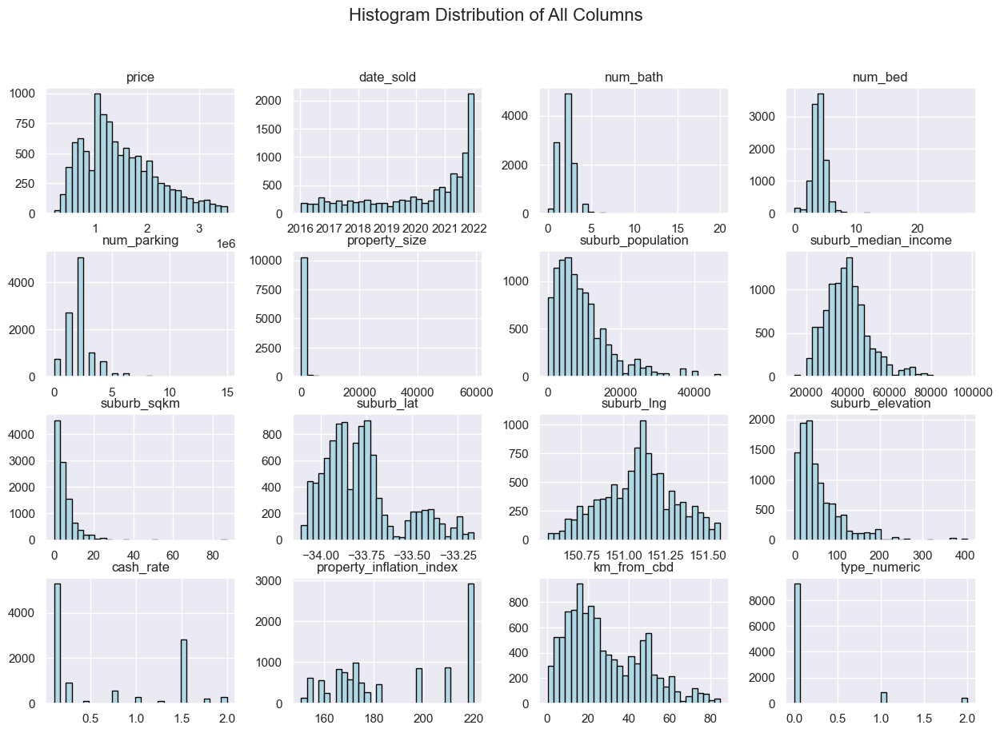

In [205]:
# Plot histogram for all numerical columns
df1_filtered.hist(figsize=(15, 10), bins=30, color='lightblue', edgecolor='black')
plt.suptitle('Histogram Distribution of All Columns', fontsize=16)
plt.show()

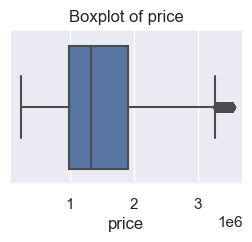

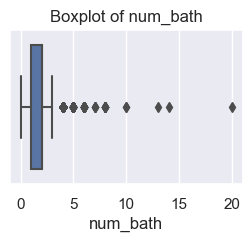

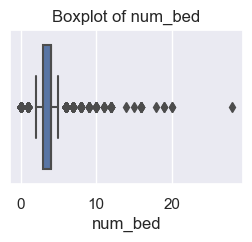

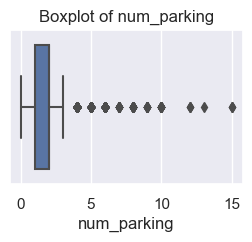

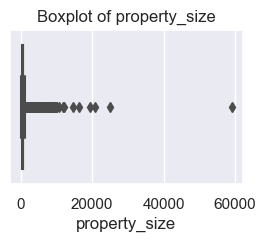

...

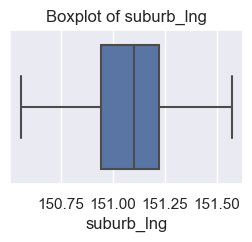

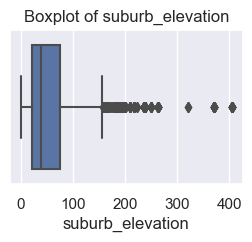

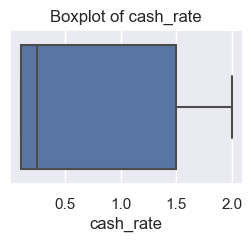

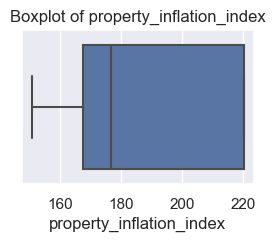

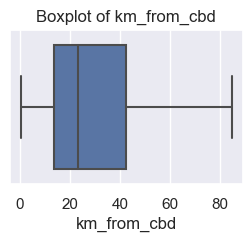

In [107]:
#Boxplot
numerical_columns = df1_filtered.select_dtypes(include=['float64', 'int64']).columns
for column in numerical_columns:
    plt.figure(figsize=(3, 2))
    sns.boxplot(x=df1_filtered[column])
    plt.title(f"Boxplot of {column}")
    plt.show()

/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/2895611693.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



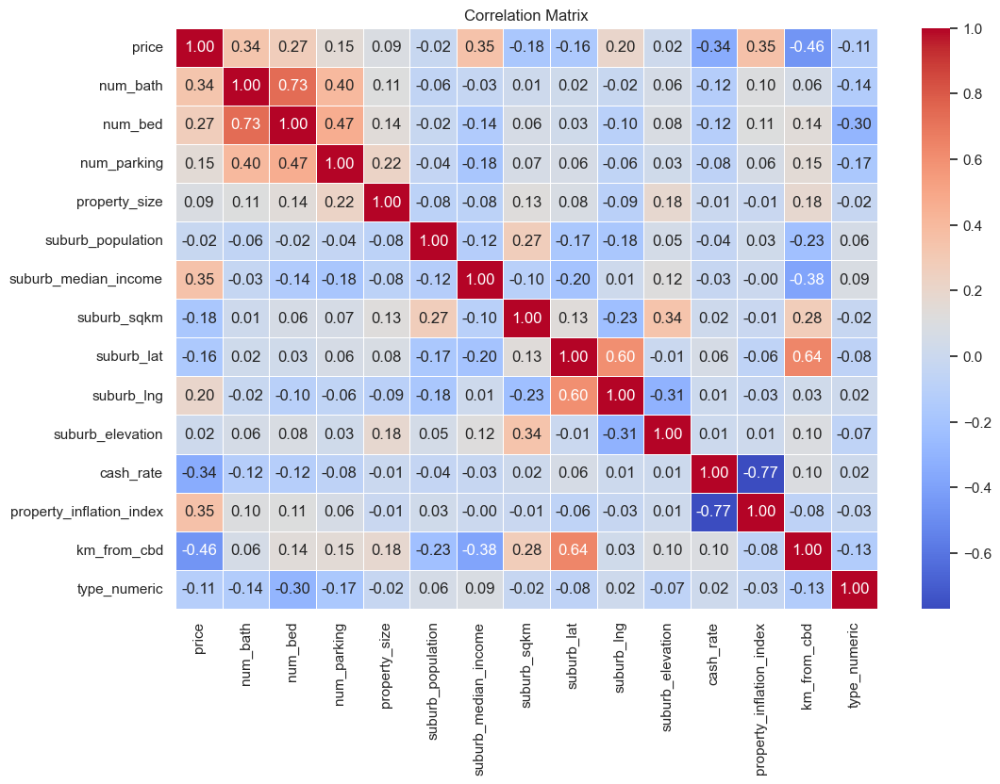

In [206]:
# Compute the correlation matrix
correlation_matrix = df1_filtered.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [207]:
prediction_df= df1_filtered.copy
prediction_df=df1_filtered.drop(['date_sold','suburb_lat','suburb_lng','suburb_group','suburb','type'], axis='columns')
prediction_df.head()

,price,num_bath,num_bed,num_parking,property_size,suburb_population,suburb_median_income,suburb_sqkm,suburb_elevation,cash_rate,property_inflation_index,km_from_cbd,type_numeric
0,530000,4,4,2,1351,7093,29432,9.914,24,2.0,150.9,47.05,0
1,525000,2,4,2,594,2538,24752,1.397,23,2.0,150.9,78.54,0
2,480000,2,4,2,468,2028,31668,1.116,3,2.0,150.9,63.59,0
3,452000,1,3,1,344,9835,32292,4.055,81,2.0,150.9,40.12,0
4,365500,0,0,0,1850,2200,45084,1.497,18,2.0,150.9,49.98,2


In [208]:
x=prediction_df.drop(['price'],axis=1)
y=prediction_df['price']

In [209]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=101)

In [210]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Train the model
lr_model = LinearRegression()
lr_model.fit(x_train, y_train)

# Predict and evaluate
y_pred_lr = lr_model.predict(x_test)
print("Linear Regression RMSE:", mean_squared_error(y_test, y_pred_lr, squared=False))
print("Linear Regression R2 Score:", r2_score(y_test, y_pred_lr))

Linear Regression RMSE: 479850.0131934822
Linear Regression R2 Score: 0.5063546365395637


/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [211]:
from sklearn.tree import DecisionTreeRegressor

# Train the model
dt_model = DecisionTreeRegressor(random_state=101)
dt_model.fit(x_train, y_train)

# Predict and evaluate
y_pred_dt = dt_model.predict(x_test)
print("Decision Tree RMSE:", mean_squared_error(y_test, y_pred_dt, squared=False))
print("Decision Tree R2 Score:", r2_score(y_test, y_pred_dt))

Decision Tree RMSE: 474644.09153683815
Decision Tree R2 Score: 0.5170077099235787


/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [212]:
from sklearn.ensemble import RandomForestRegressor

# Train the model
rf_model = RandomForestRegressor(random_state=101, n_estimators=500, max_depth=30)
rf_model.fit(x_train, y_train)

# Predict and evaluate
y_pred_rf = rf_model.predict(x_test)
print("Random Forest RMSE:", mean_squared_error(y_test, y_pred_rf, squared=False))
print("Random Forest R2 Score:", r2_score(y_test, y_pred_rf))

Random Forest RMSE: 336504.6492293159
Random Forest R2 Score: 0.757234941700742


/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [242]:
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import pygad

# Define the dataset
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Define the fitness function
def fitness_function(ga_instance, solution, solution_idx):
    n_estimators = int(solution[0])  # Number of trees
    max_depth = int(solution[1]) if solution[1] > 0 else None  # Maximum depth
    min_samples_split = int(solution[2])  # Minimum samples per split

    # Train the Random Forest model
    model = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        random_state=42
    )
    model.fit(x_train, y_train)

    # Predict and calculate RMSE
    predictions = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))

    return -rmse  # Negative because PyGAD maximizes fitness

# Define the search space
gene_space = [
    range(10, 500),  # n_estimators: 10 to 200
    range(1, 50),    # max_depth: 1 to 50
    range(2, 20)     # min_samples_split: 2 to 20
]

# Set up the Genetic Algorithm
ga_instance = pygad.GA(
    num_generations=20,
    num_parents_mating=5,
    fitness_func=fitness_function,
    sol_per_pop=10,
    num_genes=len(gene_space),
    gene_space=gene_space,
    parent_selection_type="sss",
    crossover_type="single_point",
    mutation_type="random",
    mutation_percent_genes=10
)

# Run the Genetic Algorithm
ga_instance.run()

# Get the best solution
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print(f"Best solution (n_estimators, max_depth, min_samples_split): {solution}")
print(f"Best solution fitness (negative RMSE): {solution_fitness}")

# Train the final model with the best hyperparameters
best_n_estimators = int(solution[0])
best_max_depth = int(solution[1]) if solution[1] > 0 else None
best_min_samples_split = int(solution[2])

final_model = RandomForestRegressor(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    min_samples_split=best_min_samples_split,
    random_state=42
)
final_model.fit(x_train, y_train)

# Evaluate the final model
final_predictions = final_model.predict(x_test)
final_rmse = np.sqrt(mean_squared_error(y_test, final_predictions))
print(f"Final RMSE: {final_rmse}")

/Users/linhdao/anaconda3/lib/python3.11/site-packages/pygad/pygad.py:744: UserWarning:

The percentage of genes to mutate (mutation_percent_genes=10) resulted in selecting (0) genes. The number of genes to mutate is set to 1 (mutation_num_genes=1).
If you do not want to mutate any gene, please set mutation_type=None.



Best solution (n_estimators, max_depth, min_samples_split): [196.  45.   2.]
Best solution fitness (negative RMSE): -336526.07798530796
Final RMSE: 336526.07798530796


In [213]:
from sklearn.svm import SVR

# Train the model
svm_model = SVR(kernel='linear', C=1.0, epsilon=0.1)
svm_model.fit(x_train, y_train)

# Predict and evaluate
y_pred_svm = svm_model.predict(x_test)
print("SVM RMSE:", mean_squared_error(y_test, y_pred_svm, squared=False))
print("SVM R2 Score:", r2_score(y_test, y_pred_svm))

SVM RMSE: 543419.2495521144
SVM R2 Score: 0.3668974294394518


/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the 

               Model           RMSE  R2 Score
0  Linear Regression  479850.013193  0.506355
1      Decision Tree  474644.091537  0.517008
2      Random Forest  336504.649229  0.757235
3                SVM  543419.249552  0.366897


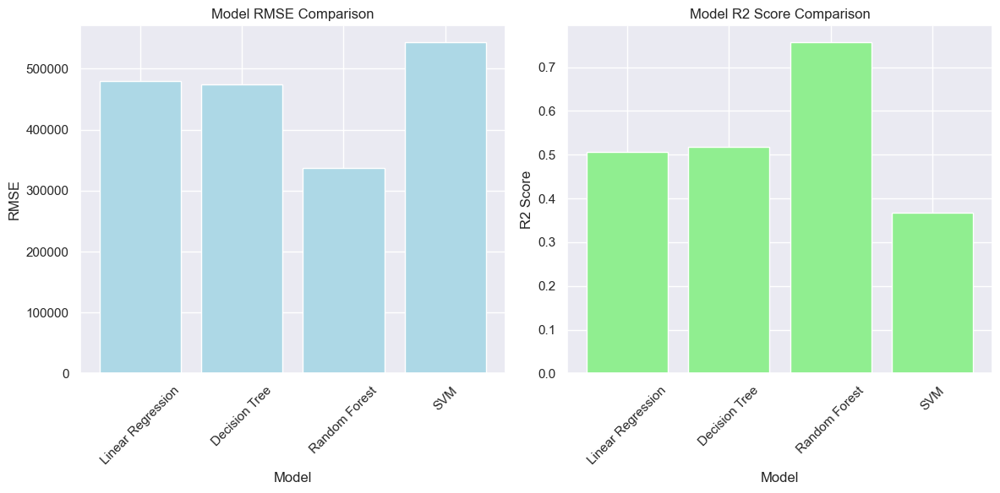

In [214]:
import matplotlib.pyplot as plt
import pandas as pd

# Store model performance metrics
model_performance = {
    "Model": ["Linear Regression", "Decision Tree", "Random Forest", "SVM"],
    "RMSE": [
        mean_squared_error(y_test, y_pred_lr, squared=False),
        mean_squared_error(y_test, y_pred_dt, squared=False),
        mean_squared_error(y_test, y_pred_rf, squared=False),
        mean_squared_error(y_test, y_pred_svm, squared=False)
    ],
    "R2 Score": [
        r2_score(y_test, y_pred_lr),
        r2_score(y_test, y_pred_dt),
        r2_score(y_test, y_pred_rf),
        r2_score(y_test, y_pred_svm)
    ]
}

# Convert to DataFrame
performance_df = pd.DataFrame(model_performance)

# Display the table
print(performance_df)

# Plot the performance metrics
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Bar chart for RMSE
ax[0].bar(performance_df["Model"], performance_df["RMSE"], color='lightblue')
ax[0].set_title("Model RMSE Comparison")
ax[0].set_ylabel("RMSE")
ax[0].set_xlabel("Model")
ax[0].tick_params(axis='x', rotation=45)

# Bar chart for R2 Score
ax[1].bar(performance_df["Model"], performance_df["R2 Score"], color='lightgreen')
ax[1].set_title("Model R2 Score Comparison")
ax[1].set_ylabel("R2 Score")
ax[1].set_xlabel("Model")
ax[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [117]:
#SECOND DATASET

df2 = pd.read_excel('/Users/linhdao/Library/CloudStorage/OneDrive-TheUniversityOfNewcastle/COMP3330/asssessment 2 - individual project/641606.xlsx')
df2

,Unnamed: 0,Value of dwelling stock; Owned by Households ; New South Wales ;,Value of dwelling stock; Owned by Households ; Victoria ;,Value of dwelling stock; Owned by Households ; Queensland ;,Value of dwelling stock; Owned by Households ; South Australia ;,Value of dwelling stock; Owned by Households ; Western Australia ;,Value of dwelling stock; Owned by Households ; Tasmania ;,Value of dwelling stock; Owned by Households ; Northern Territory ;,Value of dwelling stock; Owned by Households ; Australian Capital Territory ;,Value of dwelling stock; Owned by Households ; Australia ;,...,Mean price of residential dwellings ; Australia ;,Number of residential dwellings ; New South Wales ;,Number of residential dwellings ; Victoria ;,Number of residential dwellings ; Queensland ;,Number of residential dwellings ; South Australia ;,Number of residential dwellings ; Western Australia ;,Number of residential dwellings ; Tasmania ;,Number of residential dwellings ; Northern Territory ;,Number of residential dwellings ; Australian Capital Territory ;,Number of residential dwellings ; Australia ;
0,Unit,$ Millions,$ Millions,$ Millions,$ Millions,$ Millions,$ Millions,$ Millions,$ Millions,$ Millions,...,$'000,000,000,000,000,000,000,000,000,000
1,Series Type,Original,Original,Original,Original,Original,Original,Original,Original,Original,...,Original,Original,Original,Original,Original,Original,Original,Original,Original,Original
2,Data Type,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,...,AVERAGE,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK,STOCK
3,Frequency,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,...,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter,Quarter
4,Collection Month,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
5,Series Start,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,...,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00,2011-09-01 00:00:00
6,Series End,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,...,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00,2021-12-01 00:00:00
7,No. Obs,42,42,42,42,42,42,42,42,42,...,42,42,42,42,42,42,42,42,42,42
8,Series ID,A83728603C,A83728608R,A83728613J,A83728618V,A83728623L,A83728628X,A83728633T,A83728638C,A83728643W,...,A83728647F,A83728605J,A83728610A,A83728615L,A83728620F,A83728625T,A83728630K,A83728635W,A83728640R,A83728645A
9,2011-09-01 00:00:00,1453495,1121374.8,723858.5,253939.4,464342.1,65479.7,30196.1,72384.2,4185069.8,...,490.8,2839,2265.6,1784.5,722.3,942,230.5,74,144.9,9002.7


In [118]:
df2.describe()
print(df2.columns.tolist())
# List of column names to keep
columns_to_keep = ['Unnamed: 0',
                'Mean price of residential dwellings ;  New South Wales ;', 
                'Mean price of residential dwellings ;  Victoria ;',
                'Mean price of residential dwellings ;  Queensland ;',
                'Mean price of residential dwellings ;  South Australia ;',
                'Mean price of residential dwellings ;  Western Australia ;',
                'Mean price of residential dwellings ;  Tasmania ;',
                'Mean price of residential dwellings ;  Northern Territory ;',
                'Mean price of residential dwellings ;  Australian Capital Territory ;',
                'Mean price of residential dwellings ;  Australia ;']

# Filter the DataFrame to keep only the specified columns
house_mean_price_df = df2[columns_to_keep]
# Define a mapping of old column names to new column names
column_rename_mapping = {
                'Mean price of residential dwellings ;  New South Wales ;': 'New South Wales', 
                'Mean price of residential dwellings ;  Victoria ;': 'Victoria',
                'Mean price of residential dwellings ;  Queensland ;': 'Queensland',
                'Mean price of residential dwellings ;  South Australia ;': 'South Australia',
                'Mean price of residential dwellings ;  Western Australia ;': 'Western Australia',
                'Mean price of residential dwellings ;  Tasmania ;': 'Tasmania',
                'Mean price of residential dwellings ;  Northern Territory ;': 'Northern Territory',
                'Mean price of residential dwellings ;  Australian Capital Territory ;': 'Australian Capital Territory',
                'Mean price of residential dwellings ;  Australia ;': 'Australia'
}
# Rename the columns in the DataFrame
house_mean_price_df.rename(columns=column_rename_mapping, inplace=True)

# Remove the first 9 rows
house_mean_price_df = house_mean_price_df.iloc[9:]

# List of columns to update (excluding the first column)
columns_to_update = [
    'New South Wales',
    'Victoria',
    'Queensland',
    'South Australia',
    'Western Australia',
    'Tasmania',
    'Northern Territory',
    'Australian Capital Territory',
    'Australia'
]
# Multiply the values in the specified columns by 1000
house_mean_price_df[columns_to_update] = house_mean_price_df[columns_to_update] * 1000

# Convert 'Unnamed: 0' to datetime
house_mean_price_df['Unnamed: 0'] = pd.to_datetime(house_mean_price_df['Unnamed: 0'],format='%Y-%m-%d', errors='coerce')
# Rename the column 'Unnamed: 0' to 'Date'
house_mean_price_df.rename(columns={'Unnamed: 0': 'Date'}, inplace=True)

house_mean_price_df


['Unnamed: 0', 'Value of dwelling stock; Owned by Households ;  New South Wales ;', 'Value of dwelling stock; Owned by Households ;  Victoria ;', 'Value of dwelling stock; Owned by Households ;  Queensland ;', 'Value of dwelling stock; Owned by Households ;  South Australia ;', 'Value of dwelling stock; Owned by Households ;  Western Australia ;', 'Value of dwelling stock; Owned by Households ;  Tasmania ;', 'Value of dwelling stock; Owned by Households ;  Northern Territory ;', 'Value of dwelling stock; Owned by Households ;  Australian Capital Territory ;', 'Value of dwelling stock; Owned by Households ;  Australia ;', 'Value of dwelling stock; Owned by Non-Households ;  New South Wales ;', 'Value of dwelling stock; Owned by Non-Households ;  Victoria ;', 'Value of dwelling stock; Owned by Non-Households ;  Queensland ;', 'Value of dwelling stock; Owned by Non-Households ;  South Australia ;', 'Value of dwelling stock; Owned by Non-Households ;  Western Australia ;', 'Value of dwelli

/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/547688050.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,New South Wales,Victoria,Queensland,South Australia,Western Australia,Tasmania,Northern Territory,Australian Capital Territory,Australia
9,2011-09-01,540800.0,512600.0,428800.0,379900.0,524800.0,305100.0,522700.0,547500.0,490800.0
10,2011-12-01,535300.0,506600.0,425700.0,384300.0,521400.0,310000,472500.0,561500.0,486900.0
11,2012-03-01,547100.0,500000,422400.0,377400.0,532400.0,304700.0,464600.0,553000,488600.0
12,2012-06-01,552200.0,500200.0,423200.0,378100.0,530400.0,295200.0,457300.0,552200.0,489900.0
13,2012-09-01,544500.0,491700.0,426100.0,375500.0,537700.0,291100.0,466200.0,542700.0,486300.0
14,2012-12-01,562000,501700.0,426100.0,375600.0,550300.0,297800.0,501200.0,564100.0,496400.0
15,2013-03-01,569300.0,506800.0,427000,379700.0,560900.0,293700.0,488600.0,543800.0,501100.0
16,2013-06-01,580000,511400.0,431000,379400.0,572700.0,297600.0,492200.0,564500.0,508100.0
17,2013-09-01,594000,523300.0,430300.0,383500.0,572400.0,297500.0,498300.0,550200.0,515500.0
18,2013-12-01,620600.0,538100.0,439500.0,396800.0,586000,306600.0,521900.0,573000,532700.0


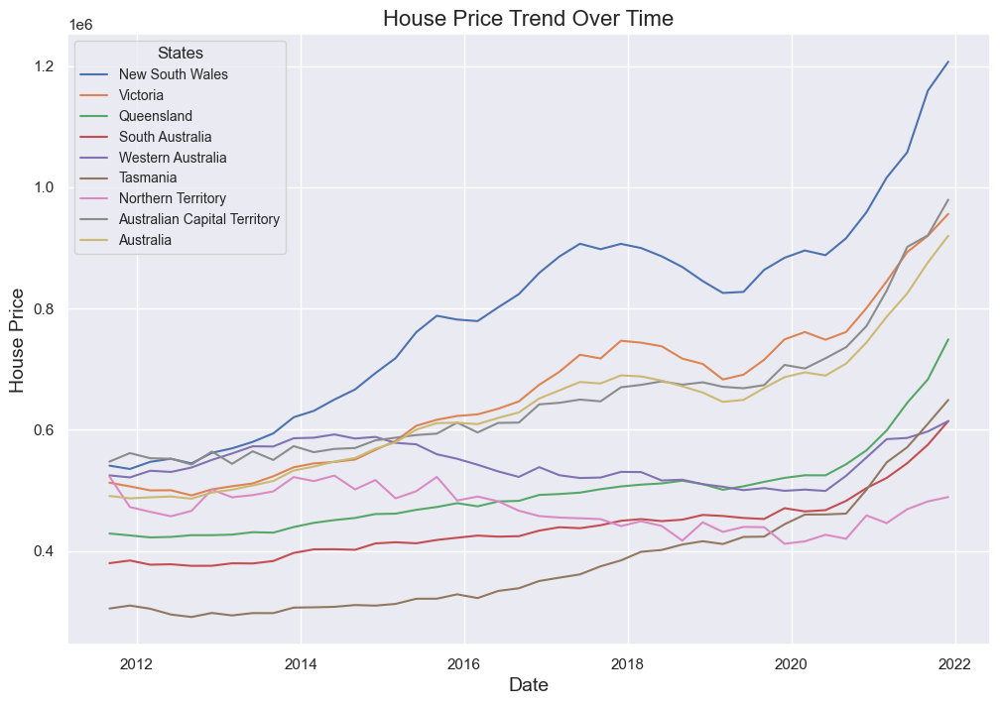

In [119]:
from matplotlib.dates import DateFormatter

# Plot the line graph for each state
plt.figure(figsize=(12, 8))

# Iterate through each column except 'Date' and plot against the 'Date' column
for column in house_mean_price_df.columns:
    if column != 'Date':  # Exclude the 'Date' column from the y-axis
        plt.plot(house_mean_price_df['Date'], house_mean_price_df[column], label=column)

# Add labels, title, and legend
plt.title('House Price Trend Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('House Price', fontsize=14)
plt.legend(title='States', fontsize=10)
plt.grid(True)

# Define ax and set the date formatter
ax = plt.gca()
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
plt.show()

In [120]:
house_mean_price_df.head(10)

,Date,New South Wales,Victoria,Queensland,South Australia,Western Australia,Tasmania,Northern Territory,Australian Capital Territory,Australia
9,2011-09-01,540800.0,512600.0,428800.0,379900.0,524800.0,305100.0,522700.0,547500.0,490800.0
10,2011-12-01,535300.0,506600.0,425700.0,384300.0,521400.0,310000,472500.0,561500.0,486900.0
11,2012-03-01,547100.0,500000,422400.0,377400.0,532400.0,304700.0,464600.0,553000,488600.0
12,2012-06-01,552200.0,500200.0,423200.0,378100.0,530400.0,295200.0,457300.0,552200.0,489900.0
13,2012-09-01,544500.0,491700.0,426100.0,375500.0,537700.0,291100.0,466200.0,542700.0,486300.0
14,2012-12-01,562000,501700.0,426100.0,375600.0,550300.0,297800.0,501200.0,564100.0,496400.0
15,2013-03-01,569300.0,506800.0,427000,379700.0,560900.0,293700.0,488600.0,543800.0,501100.0
16,2013-06-01,580000,511400.0,431000,379400.0,572700.0,297600.0,492200.0,564500.0,508100.0
17,2013-09-01,594000,523300.0,430300.0,383500.0,572400.0,297500.0,498300.0,550200.0,515500.0
18,2013-12-01,620600.0,538100.0,439500.0,396800.0,586000,306600.0,521900.0,573000,532700.0


In [ ]:
print(house_mean_price_df.isna().sum())

house_mean_price_df.iloc[:, 1:] = house_mean_price_df.iloc[:, 1:].astype(int)
# Check the data types again
house_mean_price_df.dtypes

Date                            0
New South Wales                 0
Victoria                        0
Queensland                      0
South Australia                 0
Western Australia               0
Tasmania                        0
Northern Territory              0
Australian Capital Territory    0
Australia                       0
dtype: int64

In [124]:
#ARIMA - AUTOREGRESSIVE INTEGRATED MOVING AVERAGE
%pip install pmdarima

Note: you may need to restart the kernel to use updated packages.


In [125]:
import pandas as pd
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
from matplotlib.dates import DateFormatter
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.diagnostic import acorr_ljungbox
from pmdarima.arima import auto_arima
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

In [126]:
from dateutil.parser import parse

# Get the first non-null value in the 'Date' column
sample_date = house_mean_price_df['Date'].dropna().iloc[0]

# Infer the format
date_format = sample_date.strftime('%Y-%m-%d')  # Replace with the format you expect
print(f"Sample Date: {sample_date}")
print(f"Inferred Format: {date_format}")

Sample Date: 2011-09-01 00:00:00
Inferred Format: 2011-09-01


<Figure size 1200x800 with 0 Axes>

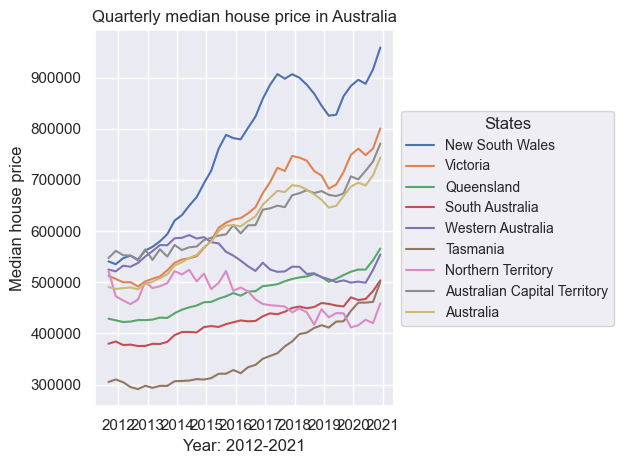

In [127]:
# Training data set
train_data = house_mean_price_df[house_mean_price_df['Date'] < '2021-03-01']

plt.figure(figsize=(12, 8))
fig, ax = plt.subplots()
plt.xlabel('Year: 2012-2021')
plt.ylabel('Median house price')
plt.title('Quarterly median house price in Australia')
for column in train_data.columns:
    if column != 'Date':  # Exclude the 'Date' column from the y-axis
        plt.plot(train_data['Date'], train_data[column], label=column)
plt.legend(title='States', fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

<Figure size 2000x1000 with 0 Axes>

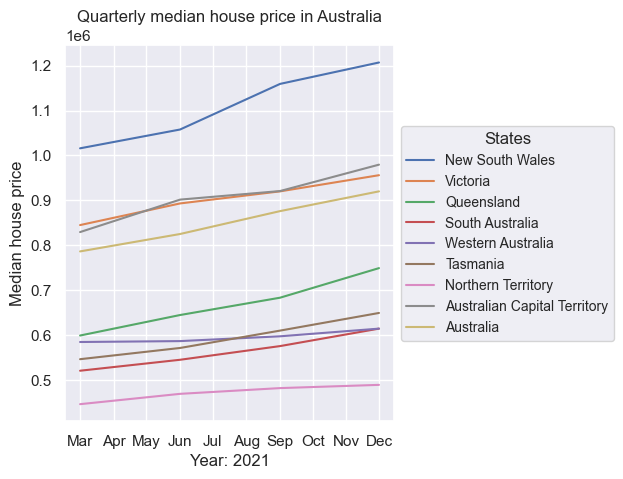

In [128]:
#Testing data set
test_data = house_mean_price_df[house_mean_price_df['Date'] >= '2021-03-01']

plt.figure(figsize=(20, 10))
fig, ax = plt.subplots()
plt.xlabel('Year: 2021')
plt.ylabel('Median house price')
plt.title('Quarterly median house price in Australia')
for column in train_data.columns:
    if column != 'Date':  # Exclude the 'Date' column from the y-axis
        plt.plot(test_data['Date'], test_data[column], label=column)
plt.legend(title='States', fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
ax.xaxis.set_major_formatter(DateFormatter('%b'))
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [129]:
from statsmodels.tsa.stattools import adfuller

# Select a time-series column to check for stationarity
# Replace 'Australia' with the column you want to analyze
time_series = house_mean_price_df['Australia']

# Perform the Augmented Dickey-Fuller test
adf_test = adfuller(time_series.dropna())

# Print the results
print("ADF Statistic:", adf_test[0])
print("p-value:", adf_test[1])
print("Critical Values:")
for key, value in adf_test[4].items():
    print(f"   {key}: {value}")

# Interpretation
if adf_test[1] <= 0.05:
    print("The time series is stationary.")
else:
    print("The time series is not stationary.")
    
# Apply differencing to make the series stationary
differenced_series = time_series.diff().dropna()

# Recheck stationarity
adf_test_diff = adfuller(differenced_series)
print("ADF Statistic (Differenced):", adf_test_diff[0])
print("p-value (Differenced):", adf_test_diff[1])
if adf_test_diff[1] <= 0.05:
    print("The differenced time series is stationary.")
else:
    print("The differenced time series is still not stationary.")

# Apply log transformation
log_series = np.log(time_series.replace(0, np.nan)).dropna()

# Recheck stationarity
adf_test_log = adfuller(log_series)
print("ADF Statistic (Log Transformed):", adf_test_log[0])
print("p-value (Log Transformed):", adf_test_log[1])
if adf_test_log[1] <= 0.05:
    print("The log-transformed time series is stationary.")
else:
    print("The log-transformed time series is still not stationary.")

# Apply log transformation and then differencing
log_diff_series = log_series.diff().dropna()

# Recheck stationarity
adf_test_log_diff = adfuller(log_diff_series)
print("ADF Statistic (Log + Differenced):", adf_test_log_diff[0])
print("p-value (Log + Differenced):", adf_test_log_diff[1])
if adf_test_log_diff[1] <= 0.05:
    print("The log-differenced time series is stationary.")
else:
    print("The log-differenced time series is still not stationary.")

# Apply log transformation and then differencing
log_diff_series = log_series.diff().dropna()

# Recheck stationarity
adf_test_log_diff = adfuller(log_diff_series)
print("ADF Statistic (Log + Differenced):", adf_test_log_diff[0])
print("p-value (Log + Differenced):", adf_test_log_diff[1])
if adf_test_log_diff[1] <= 0.05:
    print("The log-differenced time series is stationary.")
else:
    print("The log-differenced time series is still not stationary.")

# Apply seasonal differencing (e.g., lag=12 for monthly data)
seasonal_diff_series = time_series.diff(12).dropna()

# Recheck stationarity
adf_test_seasonal_diff = adfuller(seasonal_diff_series)
print("ADF Statistic (Seasonal Differenced):", adf_test_seasonal_diff[0])
print("p-value (Seasonal Differenced):", adf_test_seasonal_diff[1])
if adf_test_seasonal_diff[1] <= 0.05:
    print("The seasonally differenced time series is stationary.")
else:
    print("The seasonally differenced time series is still not stationary.")

ADF Statistic: 0.884600791764869
p-value: 0.9928860355813767
Critical Values:
   1%: -3.6055648906249997
   5%: -2.937069375
   10%: -2.606985625
The time series is not stationary.
ADF Statistic (Differenced): -1.7780952736068938
p-value (Differenced): 0.39138972201506994
The differenced time series is still not stationary.
ADF Statistic (Log Transformed): 0.4866892330651918
p-value (Log Transformed): 0.9844628616109228
The log-transformed time series is still not stationary.
ADF Statistic (Log + Differenced): -2.5748775335922174
p-value (Log + Differenced): 0.09830152528130026
The log-differenced time series is still not stationary.
ADF Statistic (Log + Differenced): -2.5748775335922174
p-value (Log + Differenced): 0.09830152528130026
The log-differenced time series is still not stationary.
ADF Statistic (Seasonal Differenced): -2.902867459306001
p-value (Seasonal Differenced): 0.0450155656284248
The seasonally differenced time series is stationary.


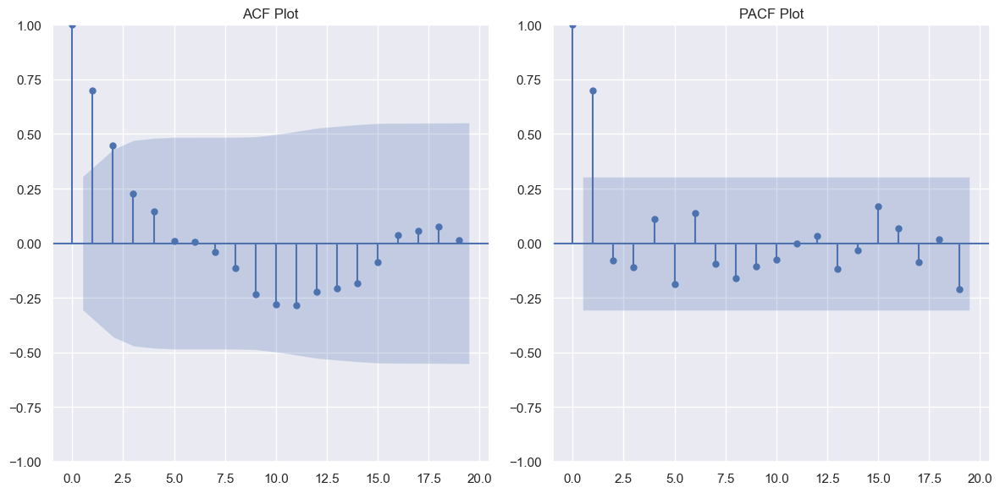

In [243]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Set the number of lags to less than half the length of the series
lags_to_plot = 19
# Plot ACF and PACF
plt.figure(figsize=(12, 6))
plt.subplot(121)
plot_acf(differenced_series, lags=lags_to_plot, ax=plt.gca())
plt.title("ACF Plot")
plt.subplot(122)
plot_pacf(differenced_series, lags=lags_to_plot, ax=plt.gca())
plt.title("PACF Plot")
plt.tight_layout()
plt.show()

/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/3251490655.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



                            OLS Regression Results                            
Dep. Variable:       #New South Wales   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.878
Method:                 Least Squares   F-statistic:                     266.6
Date:                Mon, 05 May 2025   Prob (F-statistic):           3.20e-18
Time:                        13:18:21   Log-Likelihood:                -462.97
No. Observations:                  38   AIC:                             929.9
Df Residuals:                      36   BIC:                             933.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.278e+05   1.61e+04     32.808      0.0

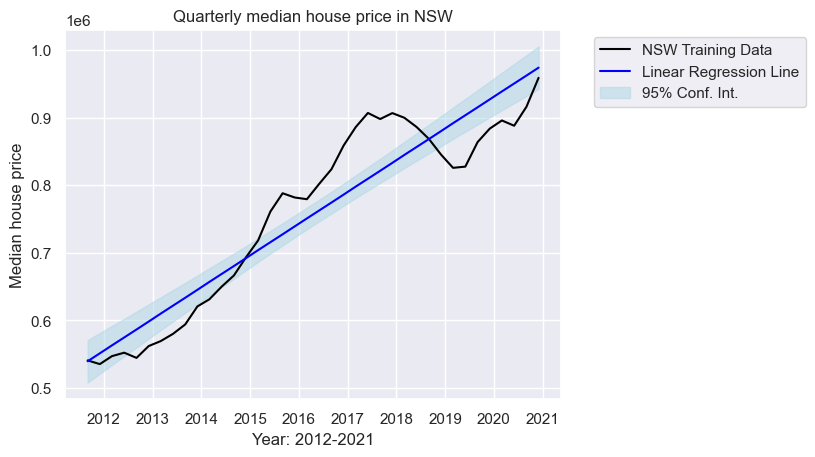

In [244]:
# Ensure the 'New South Wales' column is numeric
train_data['#New South Wales'] = pd.to_numeric(train_data['New South Wales'], errors='coerce')

# Drop any rows with NaN values after conversion
train_data = train_data.dropna(subset=['New South Wales'])

# Linear Model
lr = sm.OLS(endog=train_data['#New South Wales'], exog=sm.add_constant(np.arange(1, 1 + train_data.shape[0]))).fit()
print(lr.summary())

y_hat = lr.fittedvalues

y_ci = lr.get_prediction().conf_int(alpha=0.05)

fig, ax = plt.subplots()
plt.xlabel('Year: 2012-2021')
plt.ylabel('Median house price')
plt.title('Quarterly median house price in NSW')
plt.plot(train_data['Date'], train_data['New South Wales'], color='black', label='NSW Training Data')
plt.plot(train_data['Date'], y_hat, color='blue', label='Linear Regression Line')
plt.fill_between(train_data['Date'], y_ci[:, 0], y_ci[:, 1], color='lightblue', alpha=0.5, label='95% Conf. Int.')

plt.legend(bbox_to_anchor=(1.05, 1))
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
plt.show()

In [245]:
#ARIMA - Train the model
# Select the relevant numeric column for time series analysis
train_series = train_data['New South Wales']
test_series = test_data['New South Wales']# Ensure the column is numeric
auto_arima_model = auto_arima(train_series, m=12, with_intercept=False, suppress_warnings=True)
print(auto_arima_model.summary())
print(auto_arima_model.order)
print(auto_arima_model.seasonal_order)

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   38
Model:               SARIMAX(1, 1, 1)   Log Likelihood                -414.297
Date:                Mon, 05 May 2025   AIC                            834.595
Time:                        13:19:30   BIC                            839.427
Sample:                             0   HQIC                           836.298
                                 - 38                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9964      0.020     50.426      0.000       0.958       1.035
ma.L1         -0.9869      0.042    -23.581      0.000      -1.069      -0.905
sigma2      2.531e+08    2.9e-13   8.71e+20      0.0

In [246]:
from statsmodels.tsa.arima.model import ARIMA

# Define the ARIMA model
model = ARIMA(train_data['New South Wales'], order=(1, 4, 0))  # Replace p, d, q with your values
fitted_model = model.fit()

# Print model summary
print(fitted_model.summary())

                               SARIMAX Results                                
Dep. Variable:        New South Wales   No. Observations:                   38
Model:                 ARIMA(1, 4, 0)   Log Likelihood                -412.211
Date:                Mon, 05 May 2025   AIC                            828.423
Time:                        13:20:02   BIC                            831.475
Sample:                             0   HQIC                           829.464
                                 - 38                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1348      0.026     -5.176      0.000      -0.186      -0.084
sigma2      9.461e+08   2.51e-13   3.77e+21      0.000    9.46e+08    9.46e+08
Ljung-Box (L1) (Q):                  15.75   Jarque-

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



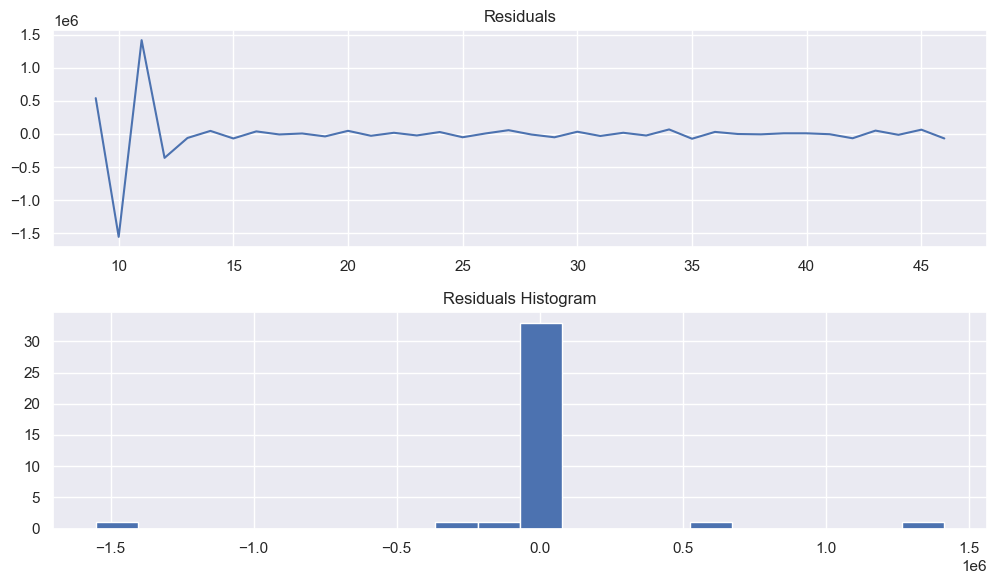

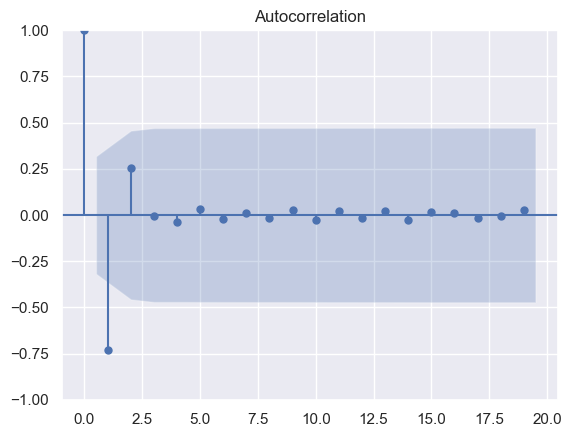

In [247]:
#Residuals
residuals = fitted_model.resid
plt.figure(figsize=(10, 6))
plt.subplot(211)
plt.plot(residuals)
plt.title("Residuals")
plt.subplot(212)
plt.hist(residuals, bins=20)
plt.title("Residuals Histogram")
plt.tight_layout()
plt.show()

res_acf = plot_acf(residuals, lags=19)

In [248]:
resid.describe()

count        38.000000
mean      14400.740668
std       89426.095250
min      -33985.044357
25%      -16545.670940
50%        2654.344156
75%       14564.196662
max      540800.000000
dtype: float64

In [261]:
# Forecast the same length as the test set
forecast = fitted_model.forecast(steps=len(test_data))

# Print forecasted values
print("Forecasted Values:")
print(forecast)

# Forecast for the test period
forecast = arima_result.get_forecast(steps=len(test_data))
forecast_mean = forecast.predicted_mean
forecast_ci = forecast.conf_int()

# Add forecast to the test data
test_data['Forecast'] = forecast_mean.values

Forecasted Values:
38    1.006128e+06
39    1.045718e+06
40    1.065895e+06
41    1.054855e+06
Name: predicted_mean, dtype: float64


/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/var/folders/s_/hv64l0cd1x3dn8nddm3v52n80000gn/T/ipykernel_53881/3355558714.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

In [257]:
print(test_data.columns)
test_data = house_mean_price_df[house_mean_price_df['Date'] >= '2021-03-01']

Index(['New South Wales', 'Forecast'], dtype='object')


In [263]:
#Test Model
auto_arima_model.fit(train_data['New South Wales'])
arima_predictions = auto_arima_model.predict(n_periods=4, alpha=0.05, return_conf_int=True)
y_pred = pd.Series(arima_predictions[0], index=test_data['Date'].index)
y_pred_lb, y_pred_ub = arima_predictions[1][:, 0], arima_predictions[1][:, 1]

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



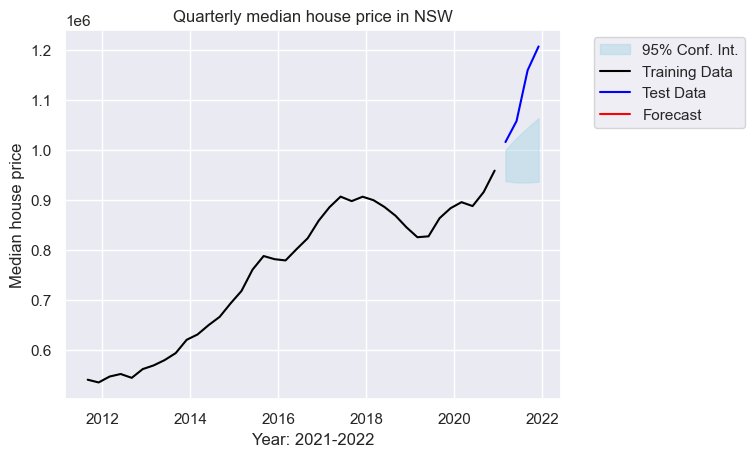

In [ ]:
#Test Model
auto_arima_model.fit(train_data['New South Wales'])
arima_predictions = auto_arima_model.predict(n_periods=4, alpha=0.05, return_conf_int=True)
y_pred = pd.Series(arima_predictions[0], index=test_data['Date'].index)
y_pred_lb, y_pred_ub = arima_predictions[1][:, 0], arima_predictions[1][:, 1]

fig, ax = plt.subplots()
plt.xlabel('Year: 2021-2022')
plt.ylabel('Median house price')
plt.title('Quarterly median house price in NSW')
plt.fill_between(test_data['Date'], forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='lightblue', alpha=0.5, label='95% Confidence Interval')
plt.fill_between(test_data['Date'], y_pred_lb, y_pred_ub, color='lightblue', alpha=0.5, label='95% Conf. Int.')
plt.plot(train_data['Date'], train_data['New South Wales'], color='black', label='Training Data')
plt.plot(test_data['Date'], test_data['New South Wales'], color='blue', label='Test Data')
plt.plot(y_pred, color='red', label='Forecast')
plt.legend(bbox_to_anchor=(1.05, 1))
ax.xaxis.set_major_formatter(DateFormatter('%Y'))


In [260]:
test_pred = pd.DataFrame({
    'Actual': test_data.iloc[:, 0].values, 
    'Point Forecast': y_pred.values, 
    'Lo 95': y_pred_lb,
    'Hi 95': y_pred_ub
    }, index=test_data.index)

test_pred.head()

,Actual,Point Forecast,Lo 95,Hi 95
47,2021-03-01,NaN,938076.975946,1.000550e+06
48,2021-06-01,NaN,935227.657770,1.024153e+06
49,2021-09-01,NaN,935224.630264,1.044835e+06
50,2021-12-01,NaN,936647.140124,1.064017e+06


In [135]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate evaluation metrics
mae = mean_absolute_error(test_data['New South Wales'], test_data['Forecast'])
mse = mean_squared_error(test_data['New South Wales'], test_data['Forecast'])
rmse = mse ** 0.5

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)

MAE: 67001.08132475338
MSE: 8054205201.47764
RMSE: 89745.22383657885


In [219]:
%pip install pygad

  Obtaining dependency information for pygad from https://files.pythonhosted.org/packages/76/6f/34abfc976dbe4f11d533e9363f91e767f81d0a49b36186abcb52d6a27896/pygad-3.4.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 3.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import pygad
# Define the dataset
def load_data():
    # Replace with your actual time series data
    time_series = house_mean_price_df['New South Wales']
    train_data = time_series[:int(len(time_series) * 0.8)]
    test_data = time_series[int(len(time_series) * 0.8):]
    return train_data, test_data

# Define the fitness function
def fitness_function(ga_instance, solution, solution_idx):
    # Extract ARIMA parameters from the solution
    p, d, q = int(solution[0]), int(solution[1]), int(solution[2])
    # Load the data
    train_data, test_data = load_data()
    try:
        # Fit the ARIMA model
        model = ARIMA(train_data, order=(p, d, q))
        model_fit = model.fit()
        # Make predictions
        predictions = model_fit.forecast(steps=len(test_data))
        # Calculate RMSE as the fitness score
        rmse = np.sqrt(mean_squared_error(test_data, predictions))
        return -rmse  # Negative because PyGAD maximizes fitness
    except:
        return 1e6  # Return a large value if the model fails

# Define the search space
gene_space = [
    range(0, 5),  # p: AR order
    range(0, 3),  # d: Differencing order
    range(0, 5)   # q: MA order
]

# Set up the Genetic Algorithm
ga_instance = pygad.GA( num_generations=10, num_parents_mating=5, fitness_func=fitness_function, sol_per_pop=10, num_genes=len(gene_space), gene_space=gene_space,
    parent_selection_type="sss",
    crossover_type="single_point",
    mutation_type="random",
    mutation_percent_genes=10
)

# Run the Genetic Algorithm
ga_instance.run()

# Get the best solution
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print(f"Best solution (p, d, q): {solution}")
print(f"Best solution fitness (negative RMSE): {solution_fitness}")

/Users/linhdao/anaconda3/lib/python3.11/site-packages/pygad/pygad.py:744: UserWarning:

The percentage of genes to mutate (mutation_percent_genes=10) resulted in selecting (0) genes. The number of genes to mutate is set to 1 (mutation_num_genes=1).
If you do not want to mutate any gene, please set mutation_type=None.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary startin

Best solution (p, d, q): [2. 2. 2.]
Best solution fitness (negative RMSE): -49636.382496563376


In [222]:
from statsmodels.tsa.arima.model import ARIMA

# Fit ARIMA model with chosen parameters (e.g., p=1, d=1, q=1)
arima_model = ARIMA(train_data['New South Wales'], order=(2, 2, 2))
arima_result = arima_model.fit()

# Print model summary
print(arima_result.summary())

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/linhdao/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



                               SARIMAX Results                                
Dep. Variable:        New South Wales   No. Observations:                   38
Model:                 ARIMA(2, 2, 2)   Log Likelihood                -398.405
Date:                Mon, 05 May 2025   AIC                            806.810
Time:                        11:20:00   BIC                            814.728
Sample:                             0   HQIC                           809.574
                                 - 38                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1331      0.140     -0.949      0.343      -0.408       0.142
ar.L2          0.7732      0.146      5.293      0.000       0.487       1.059
ma.L1         -0.0195      0.157     -0.124      0.9

In [235]:
print("Solution type:", type(solution))
print("Solution contents:", solution)

Solution type: <class 'numpy.ndarray'>
Solution contents: [2. 2. 2.]


In [239]:
print("Forecast CI Head:\n", forecast_ci.head())
print("Data Types:\n", forecast_ci.dtypes)

Forecast CI Head:
     lower New South Wales  upper New South Wales
38          963962.146501           1.029411e+06
39          964190.519020           1.101968e+06
40          957040.240617           1.174367e+06
41          947130.544014           1.248373e+06
42          933438.948155           1.320488e+06
Data Types:
 lower New South Wales    float64
upper New South Wales    float64
dtype: object


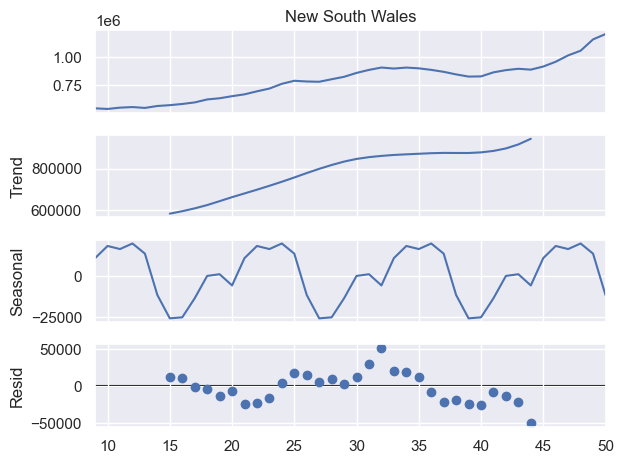

In [ ]:
#LSTM - LONG SHORT-TERM MEMORY
from statsmodels.tsa.seasonal import seasonal_decompose

results = seasonal_decompose(house_mean_price_df['New South Wales'], model='additive', period=12)
results.plot()
plt.show()

In [ ]:
from tensorflow import keras
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime
from sklearn.metrics import mean_absolute_error
from colorama import Fore, init


In [ ]:
#Sequential 
nsw = house_mean_price_df['New South Wales']
dataset = nsw.values #convert to numpy array
training_data_len = int(np.ceil(len(dataset) * 0.8)) # 80% of the data

In [141]:
#Preprocessing stages
scaler = StandardScaler()
scaled_data = scaler.fit_transform(dataset.reshape(-1, 1)) #fit and transform the data

training_data = scaled_data[:training_data_len] #95% of all out data

print(f"Length of training_data: {len(training_data)}")
print(f"Scaled data shape: {scaled_data.shape}")
print(f"Training data shape: {training_data.shape}")


Length of training_data: 34
Scaled data shape: (42, 1)
Training data shape: (34, 1)


In [191]:
# Create a sliding window
sliding_window_size = min(3, len(training_data))

x_train, y_train = [], []
for i in range(sliding_window_size, len(training_data)):
    x_train.append(training_data[i-sliding_window_size:i])
    y_train.append(training_data[i])

# Convert to NumPy arrays
x_train = np.array(x_train)
y_train = np.array(y_train)

x_train = np.array(x_train)
y_train = np.array(y_train)
print(f"X_train shape: {x_train.shape}")
print(f"Y_train shape: {y_train.shape}")

X_train shape: (31, 3, 1)
Y_train shape: (31, 1)


In [192]:
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1)) #reshape the data to be 3D

In [193]:
#Build the model
model = keras.Sequential()
#First layer
model.add(keras.layers.LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1], 1)))
#Second layer
model.add(keras.layers.LSTM(units=50, return_sequences=False))
#3rd layer (Dense)
model.add(keras.layers.Dense(units=128, activation='relu'))
#4th layer (Dropout)
model.add(keras.layers.Dropout(0.5))
#Final output layer
model.add(keras.layers.Dense(units=1)) #predicting the next price

/Users/linhdao/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [194]:
model.summary()
model.compile(optimizer='adam', loss='mean_squared_error', metrics=[keras.metrics.RootMeanSquaredError()])

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_8 (LSTM)                   │ (None, 3, 50)          │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │         6,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37,257 (145.54 KB)

 Trainable params: 37,257 (145.54 KB)

 Non-trainable params: 0 (0.00 B)

In [195]:
#Train the model
training = model.fit(x_train, y_train, batch_size=4, epochs=20) #fit the model to the training data

Epoch 1/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.5807 - root_mean_squared_error: 0.7612
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3725 - root_mean_squared_error: 0.6047 
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2426 - root_mean_squared_error: 0.4888 
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2003 - root_mean_squared_error: 0.4466 
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1296 - root_mean_squared_error: 0.3586 
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0665 - root_mean_squared_error: 0.2573 
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0377 - root_mean_squared_error: 0.1934  
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0391 - root_mean_squared_error: 0.1969 
Epoch 9/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0633 - root_mean_squared_error: 0.2496 
Epoch 10/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0466 - root_mean_squared_error: 0.2153 
Epoch 11/20
8/8 ━━━

In [196]:
#Prepare test data
test_data = scaled_data[training_data_len - 4:, :] #create the test data set
x_test, y_test = [], dataset[training_data_len:] #create the test data set

for i in range(4, len(test_data)):
    x_test.append(test_data[i-4:i, 0])

In [197]:
print(f"x_test length: {len(x_test)}")

x_test length: 8


In [198]:
x_test = np.array(x_test) #convert to numpy array
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1)) #reshape the data to be 3D
print(f"Number of sequences in x_test: {len(x_test)}")
print(f"Lengths of sequences in x_test: {[len(seq) for seq in x_test]}")

Number of sequences in x_test: 8
Lengths of sequences in x_test: [4, 4, 4, 4, 4, 4, 4, 4]


In [199]:
#Make a prediction
predictions = model.predict(x_test) #predict the prices
predictions = scaler.inverse_transform(predictions) #inverse transform the predictions to get the actual prices
print(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
[[887281.3 ]
 [896853.7 ]
 [908010.44]
 [914190.6 ]
 [920172.75]
 [929081.06]
 [944538.94]
 [961588.6 ]]


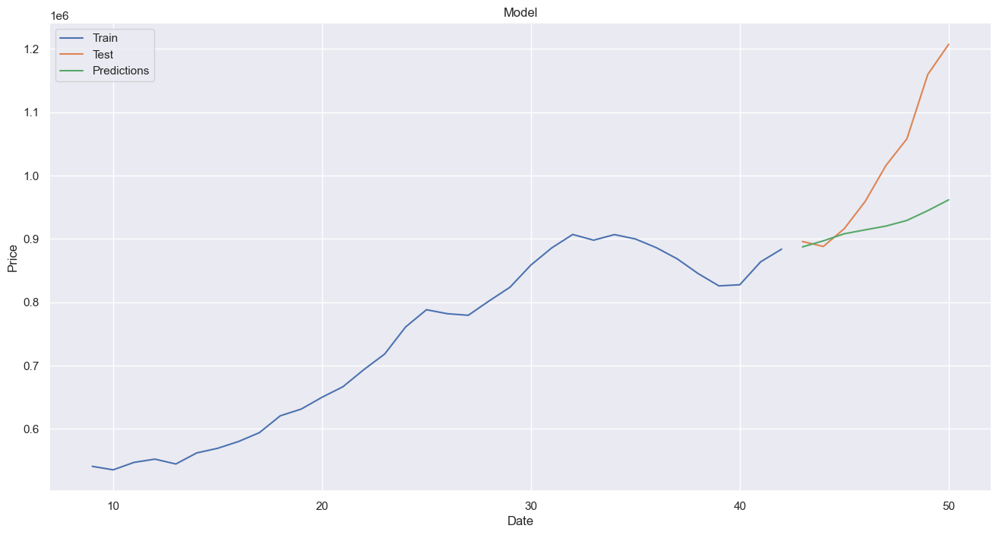

In [200]:
#Plotting data
train = house_mean_price_df[:training_data_len]
test = house_mean_price_df[training_data_len:]

test = test.copy()

test['Predictions'] = predictions #add the predictions to the test data set

plt.figure(figsize=(16, 8))
plt.plot(train['New South Wales'], label='Train')
plt.plot(test['New South Wales'], label='Test')
plt.plot(test['Predictions'], label='Predictions')
plt.title('Model')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [201]:
#RSME
RSME = np.sqrt(np.mean(np.square(predictions - y_test)))
print(f"RSME: {RSME}")
#MAE
MAE = np.mean(np.abs(predictions - y_test))
print(f"MAE: {MAE}")
#MSE
MSE = np.mean(np.square(predictions - y_test))
print(f"MSE: {MSE}")

RSME: 147942.5378638087
MAE: 109583.515625
MSE: 21886994509.584473
